In [1]:
# Installing necessary libraries
# !pip install scanpy
# !pip3 install leidenalg
# !pip install harmonypy
# !pip install muon

#loading the libraries
import os
import numpy as np
import pandas as pd
import scanpy as sc
import muon as mu
import harmonypy as hm
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
import warnings
warnings.filterwarnings('ignore')

/opt/mamba/envs/default/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
## Reading the count data and metadata files
PATH = '/ldata/latchproject1-1703208686.0438554/sc_data'
batch = pd.read_csv(f'{PATH}/batch.csv').set_index('index')
protein_counts = pd.read_csv(f'{PATH}/protein_counts.csv').set_index('index').astype('float64')
rna_counts = pd.read_csv(f'{PATH}/rna_counts.csv').set_index('index').astype('float64')

## creating anndata objects from counts
rna_adata = sc.AnnData(rna_counts)
protein_adata = sc.AnnData(protein_counts)

## Adding batch information to the Anndata objects from the metadata file
rna_adata.obs['batch'] = batch
protein_adata.obs['batch'] = batch

## remove the counts DataFrames since they have been converted to Anndata format for further analysis
del rna_counts
del protein_counts
del batch

## Making rows and column names unique (Cell barcode information is found in .obs and gene (feature) information in .var)
rna_adata.var_names_make_unique()
rna_adata.obs_names_make_unique()
protein_adata.var_names_make_unique()
protein_adata.obs_names_make_unique()

Handling antibody counts and transcript counts differently is necessary because these data types have distinct characteristics, and the biological questions addressed by each type of data may differ.

Transcript counts provide insights into gene expression and regulatory networks at the mRNA level.
Antibody counts provide information about protein expression, allowing for the study of post-transcriptional and post-translational regulation.
Integration of both transcriptomic and proteomic data can offer a more comprehensive view of cellular states, allowing for a deeper understanding of cellular heterogeneity, functional states, and regulatory mechanisms.

While transcript counts and antibody counts are related, they capture different layers of biological information. Proper handling of these data types using specialized methods and tools is necessary to extract meaningful insights from both transcriptomic and proteomic perspectives.







# Analysing RNA dataset

## Quality Control: RNA

In [3]:
# remove cells with less than 100 counts
# remove genes which are present in less than 3 cells
sc.pp.filter_cells(rna_adata, min_counts=100)
sc.pp.filter_genes(rna_adata, min_cells=3)

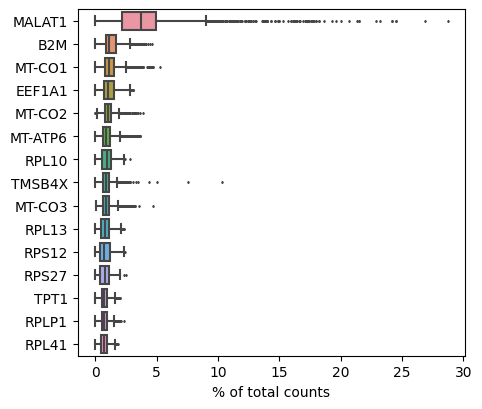

In [4]:
# display top 15 highly expressed genes
sc.pl.highest_expr_genes(rna_adata, n_top=15, )

MALAT1 is a long non-coding RNA that is highly expressed along with Mitochondrial genes (start with the prefix MT-). These act as outliers and are not very informative. High mitochondrial genes in cells indicate dead cells and need to be removed before proceeding with downstream analysis. Ribosomal proteins can be used as another useful identifier of cell state.

In [5]:
## QC plots for total genes, counts and percentage of mitochondrial and ribosomal genes in cells
rna_adata.var['mt'] = rna_adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
rna_adata.var['rb'] = rna_adata.var_names.str.startswith(('RPS','RPL'))  # annotate the group of ribosomal proteins as 'rb'

## Calculate QC Metrics
sc.pp.calculate_qc_metrics(rna_adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(rna_adata, qc_vars=['rb'], percent_top=None, log1p=False, inplace=True)

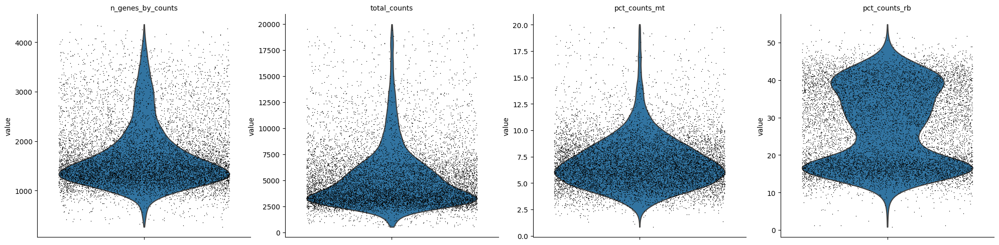

In [6]:
## Plot distribution of genes in different groups
sc.pl.violin(rna_adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_rb'], jitter=0.4, multi_panel=True)

The violin plots show some QC measures. Some cells are observed to have too high or low gene counts towards the tails of the plot. These could indicate potential doublets or technical artifacts rather than biological differences. Moreover normalization methods used in scRNA-seq data analysis may be sensitive to extreme values. Cells with extremely high gene counts can disproportionately influence normalization procedures, potentially leading to biased results in downstream analyses. Hence such cells are removed. Cells with high mitochondrial genes are also removed

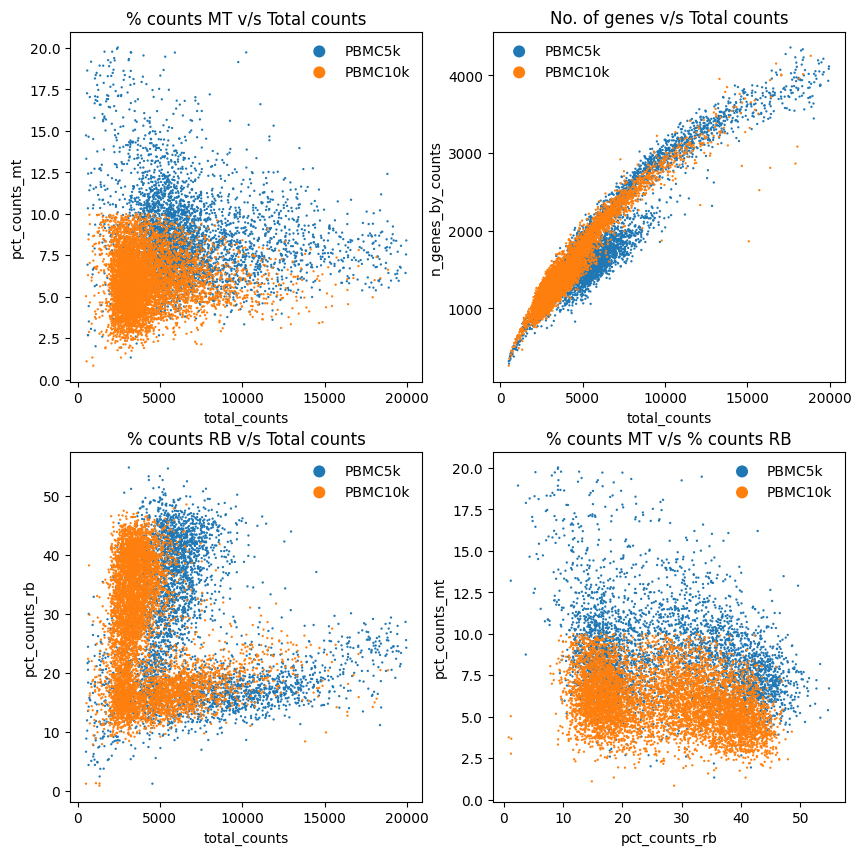

In [7]:
fig, axs = plt.subplots(2,2, figsize=(10,10))
sc.pl.scatter(rna_adata, x='total_counts', y='pct_counts_mt', color='batch', legend_loc= 'best', ax=axs[0][0],show=False, title='% counts MT v/s Total counts')
sc.pl.scatter(rna_adata, x='total_counts', y='n_genes_by_counts', color='batch', legend_loc= 'best',ax=axs[0][1],show=False, title='No. of genes v/s Total counts')
sc.pl.scatter(rna_adata, x='total_counts', y='pct_counts_rb', color='batch', legend_loc= 'best',ax=axs[1][0],show=False, title='% counts RB v/s Total counts')
sc.pl.scatter(rna_adata, x='pct_counts_rb', y='pct_counts_mt', color='batch', legend_loc= 'best',ax=axs[1][1], title='% counts MT v/s % counts RB')

The above plots show the QC distributions for each batch. Batch effects can arise due to technical variations introduced during sample processing or data generation. Plotting QC metrics separately for each batch helps in identifying and visualizing batch effects. This is important for assessing the potential impact of batch effects on downstream analysis and deciding whether batch correction methods are needed. In this case, although the distributions seem similar, the PBMC5k dataset has higher counts overall, there is a batch effect to a certain extent.

In [8]:
## Filtering out genes that do not qualify quality control
conditions = [
    (rna_adata.obs['n_genes_by_counts'] < 200),
    (rna_adata.obs['pct_counts_mt'] > 15),
    (rna_adata.obs['pct_counts_rb'] > 45),
    (rna_adata.obs['pct_counts_mt'] <= 15) & (rna_adata.obs['n_genes_by_counts'] >= 200) & (rna_adata.obs['pct_counts_rb'] <= 45)
]

values = ['Low_nFeature', 'High_MT', 'High_Rb', 'Pass']
rna_adata.obs['QC'] = np.select(conditions, values)
rna_adata.obs['QC'] = rna_adata.obs['QC'].astype('category')

In [9]:
## Print counts of genes passed and failed
rna_adata.obs['QC'].value_counts()

QC
Pass       10410
High_Rb      304
High_MT      135
Name: count, dtype: int64

A total of 10410 gene counts have passed the QC filter. We have rejected ~4% of original number of counts.

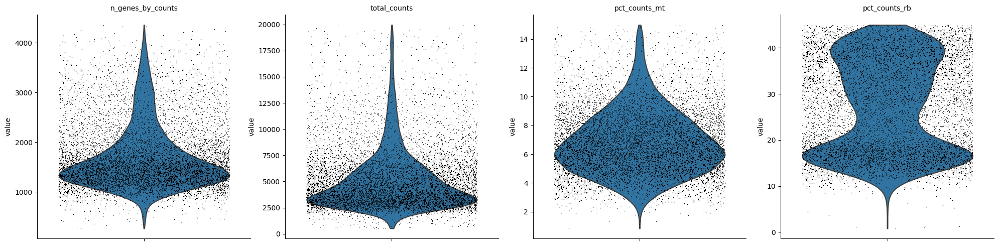

In [10]:
## Plot distribution of genes that passed QC thresholds
sc.pl.violin(rna_adata[rna_adata.obs['QC'] == 'Pass'], ['n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_rb'], jitter=0.4, multi_panel=True)

In [11]:
# Normalize for library size correction. Total-count normalizing data matrix to 10,000 reads per cell.
sc.pp.normalize_total(rna_adata, target_sum=1e4)

# Log transform the data
sc.pp.log1p(rna_adata)

 Library size is  the total number of reads or molecules obtained for each individual cell in an scRNA-seq experiment. Normalization helps account for variability in library size among different cells, ensuring that downstream analyses are not biased by differences in sequencing depth. It aids in fair comparison since larger libraries naturally tend to have higher reads.

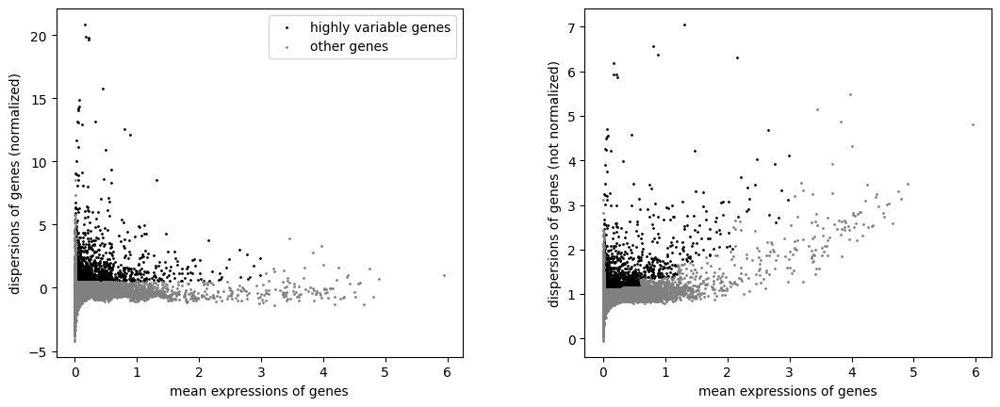

In [12]:
# Finding highly variable genes
sc.pp.highly_variable_genes(rna_adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(rna_adata)

Single cell datasets often contain a large number of genes, many of which may not vary significantly across cells. Identifying highly variable genes allows focus on the genes that exhibit substantial variation across individual cells, reducing the dimensionality of the dataset. This is crucial for efficient downstream analyses, such as clustering and dimensionality reduction.

In [13]:
# Print counts of highly represented genes
rna_adata.var.highly_variable.value_counts()

highly_variable
False    13971
True      1821
Name: count, dtype: int64

We have a total of about 1821 genes that are highly variable genes (HVG)

In [14]:
# Save total RNA data as raw data
rna_adata.raw = rna_adata

## Contructing lower dimensional embeddings for each cell using RNA data

We focus on HVGs for downstream analysis, as they as sufficient to capture the information present in the dataset.

In [15]:
## we take only highly variable genes (HVG) for PCA
rna_adata = rna_adata[:, rna_adata.var.highly_variable]

# Scale each gene to unit variance. Clip values exceeding standard deviation of 10 units
sc.pp.scale(rna_adata, max_value=10)

In [16]:
## Performing PCA
sc.tl.pca(rna_adata, svd_solver='arpack')

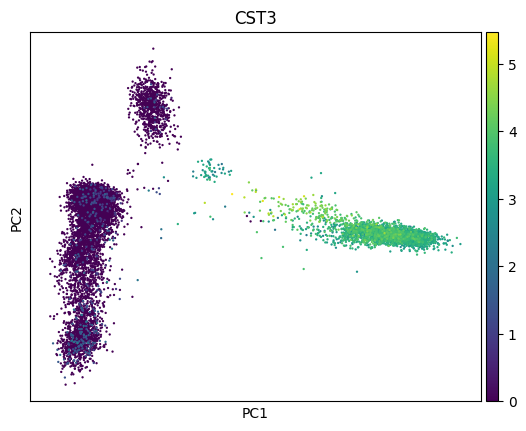

In [17]:
# Plot the first two components of PCA, coloring them by expression of CST3, which is a tentative marker of monocyte- and macrophage-like cells
sc.pl.pca_scatter(rna_adata, color='CST3')

This plot clearly indicates that Monocytes/Macrophage-like cells form a separate cluster based on it's marker gene CST3 expression

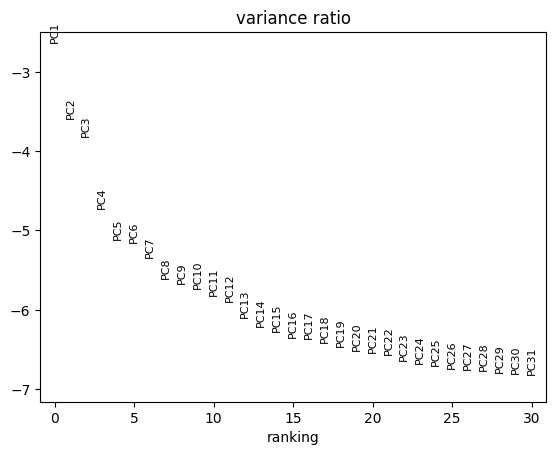

In [18]:
# Plot variance ratio for PCA clusters
sc.pl.pca_variance_ratio(rna_adata, log=True)

This provides insights into the structure and variability captured by the principal components in the scRNA-seq data. This is associated with examining the contribution of individual principal components (PCs) to the overall variance in the dataset and helps decide the max number of PCs to be used for dimensionality reduction. The "elbow" point in the plot, where the variance ratio starts to plateau, often indicates the point at which additional principal components contribute less to the overall variance. Since there is no elbow point at the lower dimesions, the default parameters are used further.

In [19]:
# compute the neighborhood graph of cells using the PCA representation of the data matrix
sc.pp.neighbors(rna_adata, n_neighbors=15, n_pcs=50)

In [20]:
## Performing primary UMAP Clustering
sc.tl.umap(rna_adata)

In [21]:
# Leiden graph-clustering method
sc.tl.leiden(rna_adata)

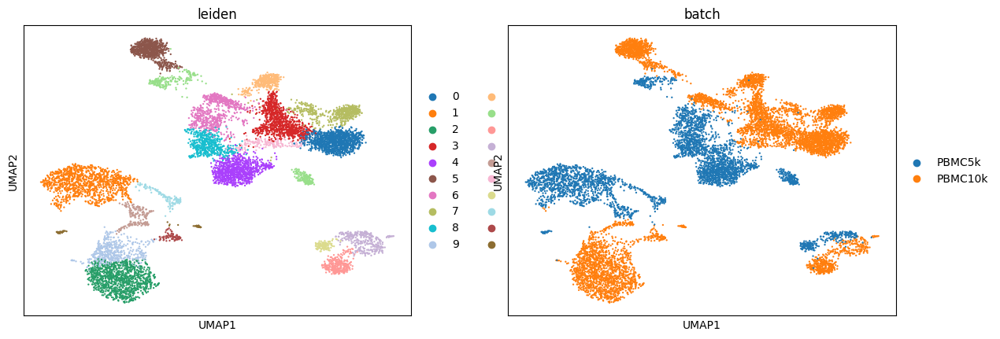

In [22]:
sc.pl.umap(rna_adata, color=['leiden', 'batch'])         ### Split plot by batch

Since the data has not been corrected for the batch effects, the two samples seem to form separate clusters. Ideally they have to overlap. For example T-cells from both samples have to form one single clusters rather than two separated by batch. This shows why batch correction is important.

## Going back to raw data for calculation of Cell Cycle scores

Different cells in the same group can be under differnet phases of cell cyle. This means they might be expressing different genes necessary for that phase. It can be interpreted as different group of cells by the algorithm based on difference in gene expressions. To account for this effect, we calculate Cell Cycle score and visualize it's influence on our dataset

In [23]:
## Calculating Cell Cycle Score

## Cell cycle analysis has to be done on the full set of genes
rna_adata = rna_adata.raw.to_adata()

## General genes expressed in S and G2 phases of cell cycle
s_genes = ['MCM5','PCNA','TYMS','FEN1','MCM7','MCM4','RRM1','UNG','GINS2','MCM6','CDCA7','DTL','PRIM1',
           'UHRF1','CENPU','HELLS','RFC2','POLR1B','NASP','RAD51AP1','GMNN','WDR76','SLBP','CCNE2','UBR7',
           'POLD3','MSH2','ATAD2','RAD51','RRM2','CDC45','CDC6','EXO1','TIPIN','DSCC1','BLM','CASP8AP2',
           'USP1','CLSPN','POLA1','CHAF1B','MRPL36','E2F8']
g2m_genes = ['HMGB2','CDK1','NUSAP1','UBE2C','BIRC5','TPX2','TOP2A','NDC80','CKS2','NUF2','CKS1B',
             'MKI67','TMPO','CENPF','TACC3','PIMREG','SMC4','CCNB2','CKAP2L','CKAP2','AURKB','BUB1',
             'KIF11','ANP32E','TUBB4B','GTSE1','KIF20B','HJURP','CDCA3','JPT1','CDC20','TTK','CDC25C',
             'KIF2C','RANGAP1','NCAPD2','DLGAP5','CDCA2','CDCA8','ECT2','KIF23','HMMR','AURKA','PSRC1',
             'ANLN','LBR','CKAP5','CENPE','CTCF','NEK2','G2E3','GAS2L3','CBX5','CENPA']

s_genes = [x for x in s_genes if x in rna_adata.var_names]
g2m_genes = [x for x in g2m_genes if x in rna_adata.var_names]

## Cell Cycle Score
sc.tl.score_genes_cell_cycle(rna_adata, s_genes=s_genes, g2m_genes=g2m_genes)

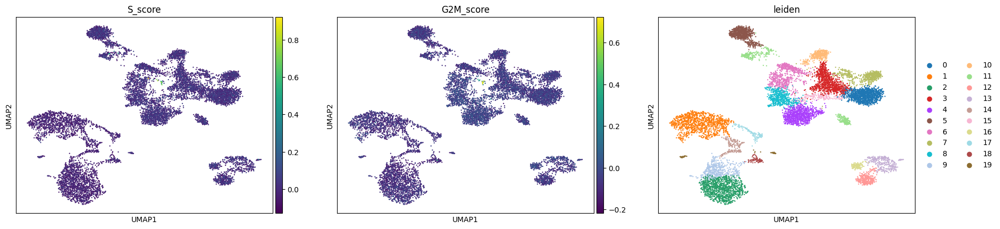

In [24]:
## Plot for all RNA reads
sc.pl.umap(rna_adata, color=['S_score','G2M_score','leiden'])

From the graphs above, we see that cell cycle scores of S and G2 phases do not have strong influence on our clustering.

## Generating Final clusters

In [25]:
# selecting 'QC' pass reads and then highly variable genes (HVG)
rna_adata = rna_adata[rna_adata.obs['QC'] == 'Pass']
sc.pp.highly_variable_genes(rna_adata, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
rna_adata = rna_adata[:, rna_adata.var.highly_variable]
rna_adata

View of AnnData object with n_obs × n_vars = 10410 × 1832
    obs: 'batch', 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'QC', 'leiden', 'S_score', 'G2M_score', 'phase'
    var: 'n_cells', 'mt', 'rb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'batch_colors', 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors'
    obsm: 'X_pca', 'X_umap'
    obsp: 'distances', 'connectivities'

For our final clustering, move ahead with a RNA matrix of 10410 x 1832

In [26]:
# regressing out the confounding variables: total UMI count, MT percentage, and cell cycle scores - to eliminate their influence on downstream analysis
sc.pp.regress_out(rna_adata, ['total_counts', 'pct_counts_mt', 'pct_counts_rb','S_score', 'G2M_score'])

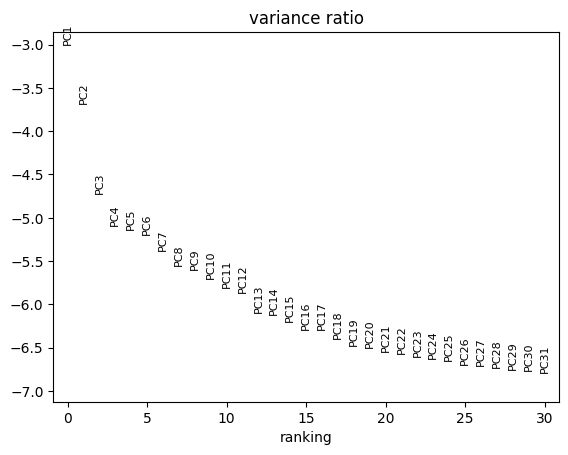

In [27]:
## Scaling data
sc.pp.scale(rna_adata, max_value=10)

# Performing final PCA clusters
sc.tl.pca(rna_adata, svd_solver='arpack')
sc.pl.pca_variance_ratio(rna_adata, log=True)

In [28]:
# Calculate neighborhood graph, do UMAP, and do clustering
sc.pp.neighbors(rna_adata, n_neighbors=15, n_pcs=30)
sc.tl.umap(rna_adata)

## Contructing lower dimensional cell type clusters using above embeddings

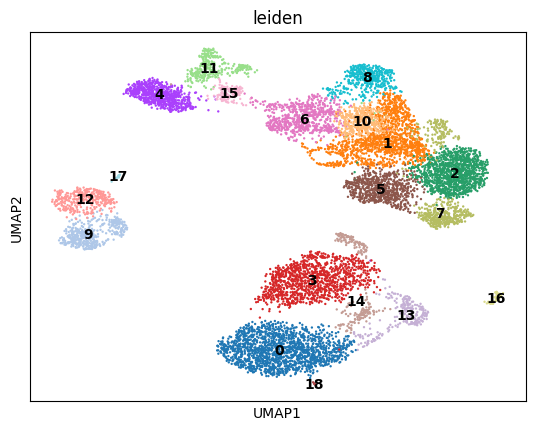

In [29]:
sc.tl.leiden(rna_adata,resolution = 0.8)
sc.pl.umap(rna_adata, color=['leiden'],legend_loc='on data')

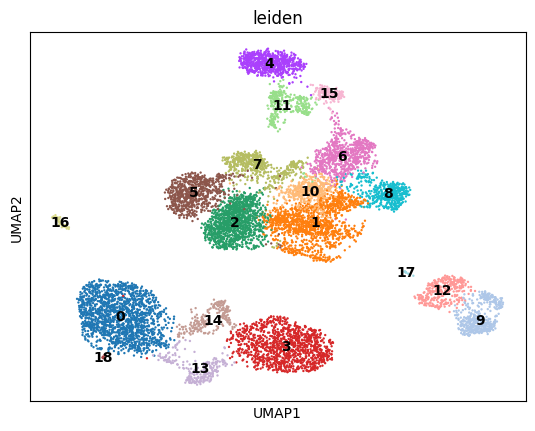

In [30]:
## Improving visualization
## Mapping out the coarse-grained connectivity structures of complex manifolds
## making a much simpler abstracted graph (PAGA graph) of clusters

sc.tl.paga(rna_adata)
sc.pl.paga(rna_adata, plot=False)  # remove `plot=False` if you want to see the coarse-grained graph
sc.tl.umap(rna_adata, init_pos='paga')
sc.pl.umap(rna_adata, color=['leiden'],legend_loc='on data')

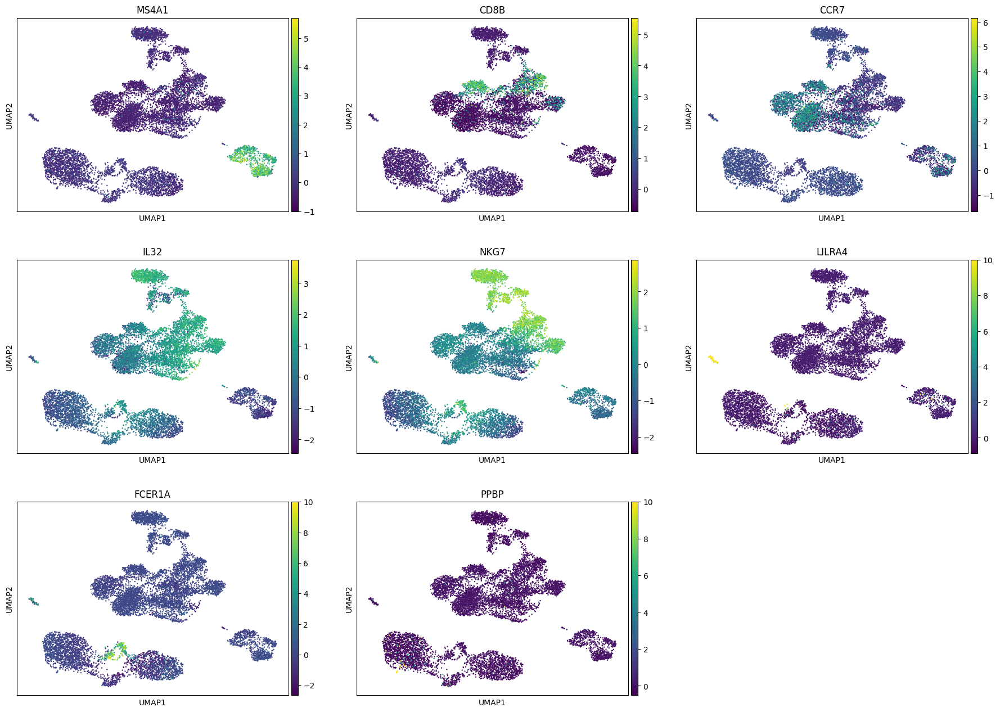

In [31]:
## Visualizing important biomarkers for cell-type identification
sc.pl.umap(rna_adata, color=['MS4A1','CD8B','CCR7','IL32','NKG7','LILRA4','FCER1A','PPBP'], ncols = 3)

Since the given data is of PBMCs, immune cell clusters are expected and their respective canonical marker genes are visialized to assign the clusters with cell-type identity.

 Now we try different resolutions and methods of clustering to see which form of clustering provides best distinction between different biomarkers present above. The distinction should correspond with regions of high expression displayed above.



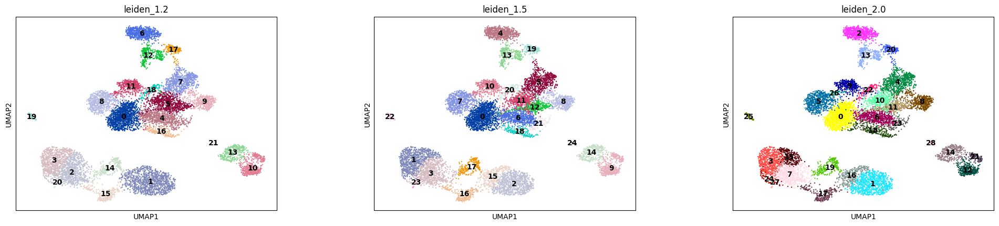

In [32]:
## Visualizing different resolutions of Leiden clustering
sc.tl.leiden(rna_adata, resolution = 1.2, key_added = "leiden_1.2")
sc.tl.leiden(rna_adata, resolution = 1.5, key_added = "leiden_1.5")
sc.tl.leiden(rna_adata, resolution = 2.0, key_added = "leiden_2.0")
sc.pl.umap(rna_adata, color=['leiden_1.2', 'leiden_1.5', 'leiden_2.0'], legend_loc='on data', wspace = 0.25, legend_fontsize=10)

Some clusters may express markers of more than one cell type. In this case, to see if the single cluster can be further resolved, different resolution values can be applied and tested to chose which gives the most biologically meaningful clusters. Different methods of clustering such as k-means clustering and heirarchical clustering can be used.

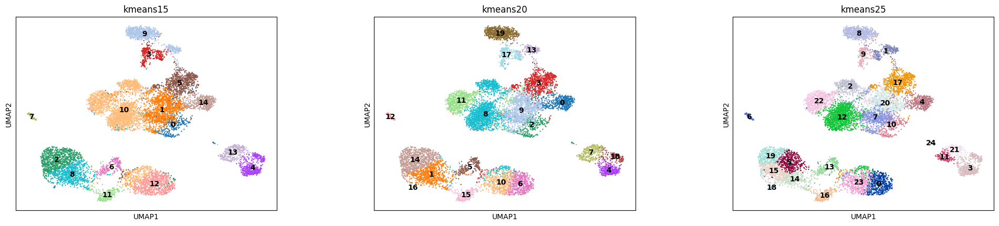

In [33]:
# Cluster Using K-means clustering
X_pca = rna_adata.obsm['X_pca']
kmeans = KMeans(n_clusters=15, random_state=0).fit(X_pca)
rna_adata.obs['kmeans15'] = kmeans.labels_.astype(str)

kmeans = KMeans(n_clusters=20, random_state=0).fit(X_pca)
rna_adata.obs['kmeans20'] = kmeans.labels_.astype(str)

kmeans = KMeans(n_clusters=25, random_state=0).fit(X_pca)
rna_adata.obs['kmeans25'] = kmeans.labels_.astype(str)

sc.pl.umap(rna_adata, color=['kmeans15', 'kmeans20', 'kmeans25'], legend_loc='on data', wspace=0.25, legend_fontsize=10)

The boundaries in K-Means clustering is not well defined. They merge into one another. In Leiden above, such boundaries have been classified as a new cluster. This helps in targeting those smaller niches of gene expressions as in the case of CD8B. This is a very sublte difference, and we choose to go ahead with the one with a finer resolution.

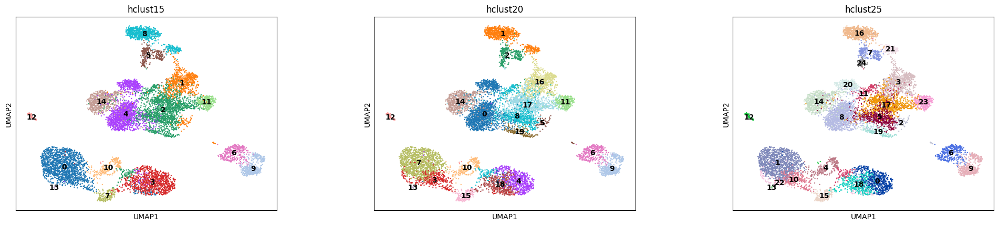

In [34]:
# Clustering using Hierarchical clustering
cluster = AgglomerativeClustering(n_clusters=15, affinity='euclidean', linkage='ward')
rna_adata.obs['hclust15'] = cluster.fit_predict(X_pca).astype(str)

cluster = AgglomerativeClustering(n_clusters=20, affinity='euclidean', linkage='ward')
rna_adata.obs['hclust20'] = cluster.fit_predict(X_pca).astype(str)

cluster = AgglomerativeClustering(n_clusters=25, affinity='euclidean', linkage='ward')
rna_adata.obs['hclust25'] = cluster.fit_predict(X_pca).astype(str)

sc.pl.umap(rna_adata, color=['hclust15', 'hclust20', 'hclust25'], legend_loc='on data', wspace = 0.25, legend_fontsize=10)

Hierarchial clustering subdivides well defined gene expression groups into smaller clusters. This seems unnecessary but it does not cause any problems downstream. The boundaries in lower most part of the clusters in 'hclust20' and 'hclust25' are not well defined and they merge into one another.

## Observations about clustering:

Different clustering methods explored:

- Leiden Clustering: Leiden clustering is a graph-based algorithm, effective in identifying communities with distinct connectivity patterns, helping to reveal cell types or states.

- K-Means Clustering: A centroid-based algorithm that partitions data into k clusters based on similarity and is sensitive to the initial choice of centroids.

- Hierarchical Clustering:Hierarchical clustering builds a tree-like structure of clusters. Agglomerative hierarchical clustering starts with individual data points as clusters and merges them based on similarity until a single cluster is formed. Divisive hierarchical clustering starts with all data points in one cluster and recursively splits them.

Although the number of clusters vary with each of the algorithms used, similar structures across these clustering methods are observed. This  may indicate that the underlying data has distinct clusters that are well-defined. However, differences in the algorithms may still lead to variations in cluster assignments, shapes, or sizes as observed.

Visualization techniques, such as  overlaying marker gene expressions on the t-SNE or UMAP, can better aid in understanding the distribution and relationships within the data to assess the biological or contextual relevance of the identified clusters. Better and reliable biological interpretation can be made with batch effects removed.

## Correcting Batch Effects

In [35]:
## Accounting for batch effects
batch_adjusted_rna_adata = rna_adata.copy()
sc.external.pp.harmony_integrate(batch_adjusted_rna_adata, 'batch')
batch_adjusted_rna_adata.obsm['X_pca'] = batch_adjusted_rna_adata.obsm['X_pca_harmony']
sc.pp.neighbors(batch_adjusted_rna_adata, n_neighbors=10, n_pcs=30)
sc.tl.umap(batch_adjusted_rna_adata)
sc.tl.leiden(batch_adjusted_rna_adata, resolution=0.8)

2023-12-27 03:41:28,835 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2023-12-27 03:41:50,576 - harmonypy - INFO - sklearn.KMeans initialization complete.
2023-12-27 03:41:50,758 - harmonypy - INFO - Iteration 1 of 10
2023-12-27 03:41:56,343 - harmonypy - INFO - Iteration 2 of 10
2023-12-27 03:42:01,867 - harmonypy - INFO - Iteration 3 of 10
2023-12-27 03:42:07,469 - harmonypy - INFO - Iteration 4 of 10
2023-12-27 03:42:12,362 - harmonypy - INFO - Iteration 5 of 10
2023-12-27 03:42:16,166 - harmonypy - INFO - Iteration 6 of 10
2023-12-27 03:42:19,650 - harmonypy - INFO - Iteration 7 of 10
2023-12-27 03:42:22,761 - harmonypy - INFO - Iteration 8 of 10
2023-12-27 03:42:25,548 - harmonypy - INFO - Iteration 9 of 10
2023-12-27 03:42:28,264 - harmonypy - INFO - Iteration 10 of 10
2023-12-27 03:42:30,958 - harmonypy - INFO - Stopped before convergence


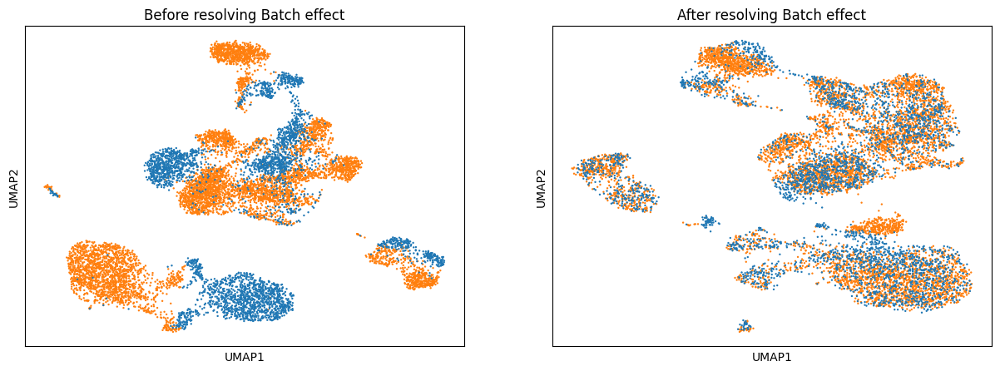

In [36]:
# Visualizing before and after batch effect
fig, axs = plt.subplots(1,2, figsize=(15,5))
sc.pl.umap(rna_adata, color=['batch'], title='Before resolving Batch effect', legend_loc = 'best', ax=axs[0], show=False)
sc.pl.umap(batch_adjusted_rna_adata, color=['batch'] , title='After resolving Batch effect', legend_loc = 'best', ax=axs[1])

Upon batch correction, now the cells from both samples overlap rather than the samples themselves forming distinct clusters. This batch correction  could give us more infomation of the biology with technical bias removed.

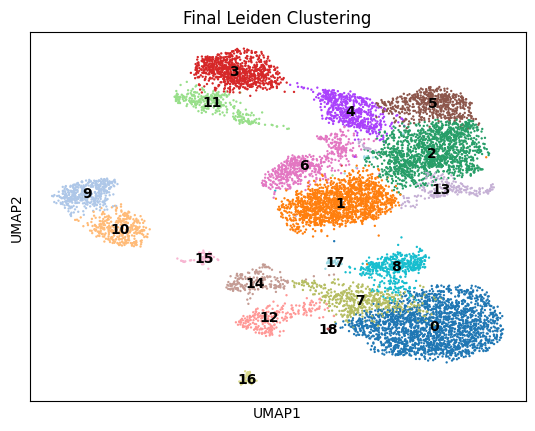

In [37]:
## Final clustering plot
sc.pl.umap(batch_adjusted_rna_adata, color=['leiden'], legend_loc='on data', title='Final Leiden Clustering')

19 clusters have been identified. Multiple clusters might be of the same cell type. This can be identified by visualizing the expression of canonical cell type marker genes and by finding the top significantly expressed genes in each cluster.

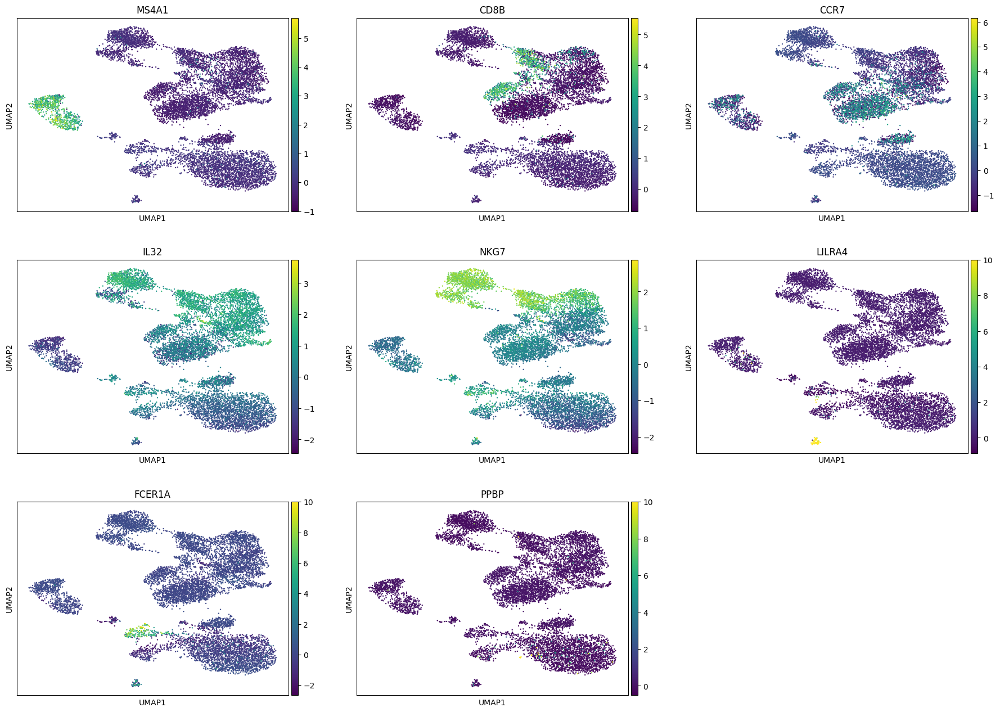

In [38]:
## Final gene expression projections for significant biomarkers
sc.pl.umap(batch_adjusted_rna_adata, color=['MS4A1','CD8B','CCR7','IL32','NKG7','LILRA4','FCER1A','PPBP'], ncols = 3)

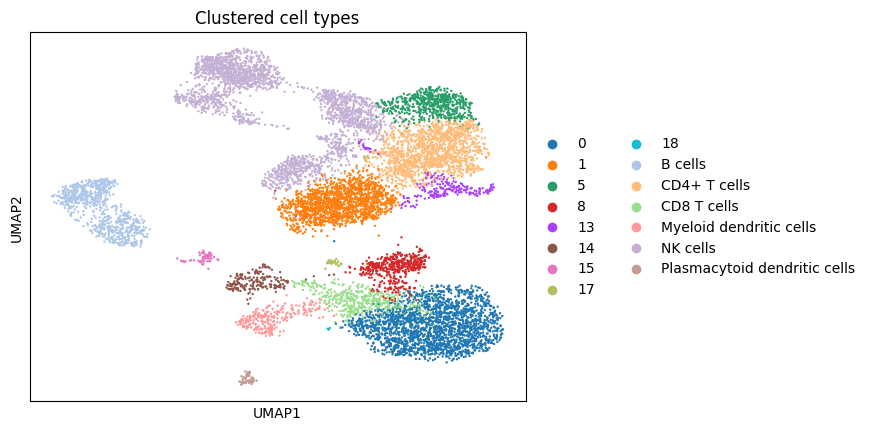

In [39]:
new_cluster_names = {
    "16": "Plasmacytoid dendritic cells",
    "12": "Myeloid dendritic cells",
    "10": "B cells", "9": "B cells",
    "7": "CD8 T cells",
    "2": "CD4+ T cells",
    "4": "NK cells", "11": "NK cells", "6": "NK cells", "3": "NK cells" 
}

batch_adjusted_rna_adata.obs['celltype'] = batch_adjusted_rna_adata.obs.leiden.astype("str").values
batch_adjusted_rna_adata.obs['celltype'] = batch_adjusted_rna_adata.obs.leiden.map(new_cluster_names).fillna(batch_adjusted_rna_adata.obs['celltype'])
sc.pl.umap(batch_adjusted_rna_adata, color="celltype", title="Clustered cell types")


* Cluster 16 - Plasmacytoid dendritic cells
* Cluster 12 - Myeloid dendritic cells
* Cluster 9,10 - B cells
* Cluster 7 - CD8 T cells
* Cluster 2 - CD4+ T cells
* Cluster 3,4,6,11 - NK cells 

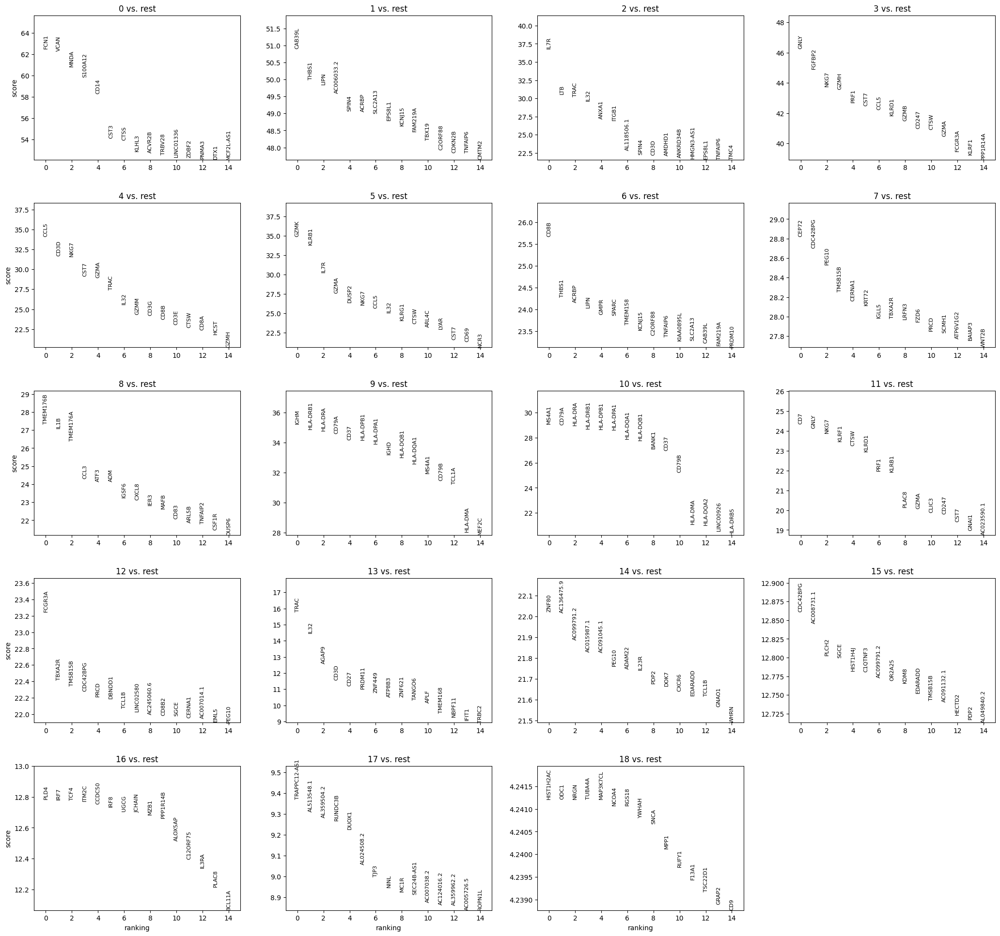

In [40]:
## Finding most significantly expressed genes
sc.tl.rank_genes_groups(batch_adjusted_rna_adata, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(batch_adjusted_rna_adata, n_genes=15, sharey=False)

These plots indicate the top 15 significantly expressed genes in each cluster compared to the rest. They can help us with identifying the cell-type or state of each cluster.

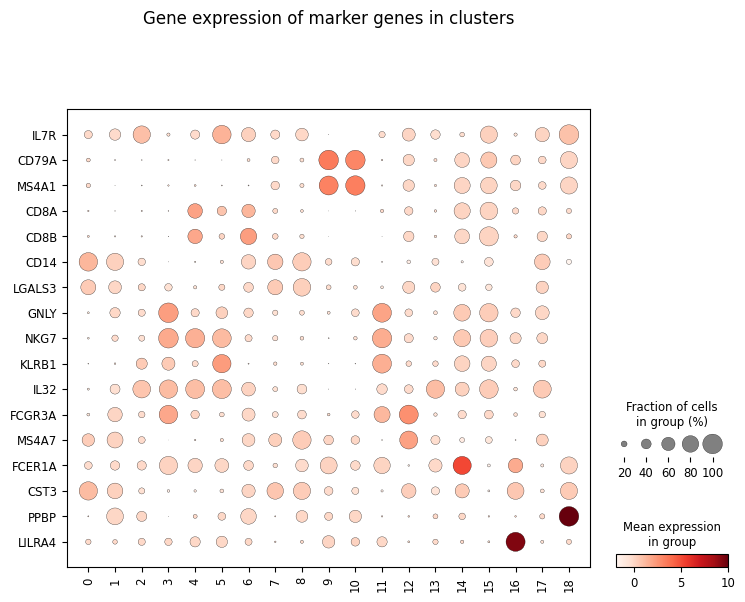

In [41]:
marker_genes = ['IL7R', 'CD79A', 'MS4A1', 'CD8A', 'CD8B', 'LYZ', 'CD14',
                'LGALS3', 'S100A8', 'GNLY', 'NKG7', 'KLRB1', 'IGLC1','IL32',
                'FCGR3A', 'MS4A7', 'FCER1A', 'CST3', 'PPBP','LILRA4']
marker_genes = [x for x in marker_genes if x in batch_adjusted_rna_adata.var.index]

sc.pl.dotplot(batch_adjusted_rna_adata, marker_genes, groupby='leiden', swap_axes=True, title='Gene expression of marker genes in clusters')

From the above dot plot, Clusters 9 and 10 are B-cells which clearly express it's markers - CD79A and MS4A1.

* Cluster 12 - Dendritic cells
* Cluster 16 - Plasmacytoid dendritic cells
* Cluster 3,4,5,10 - Natural Killer cells
* Clusters 5,6 - CD8+ T cells
* Cluster 13 - Myeloid Dendritic Cells


# Analysing Protein Dataset

### Quality Control

In [42]:
sc.pp.calculate_qc_metrics(protein_adata, var_type="antibodies", percent_top=None, log1p=False, inplace=True)

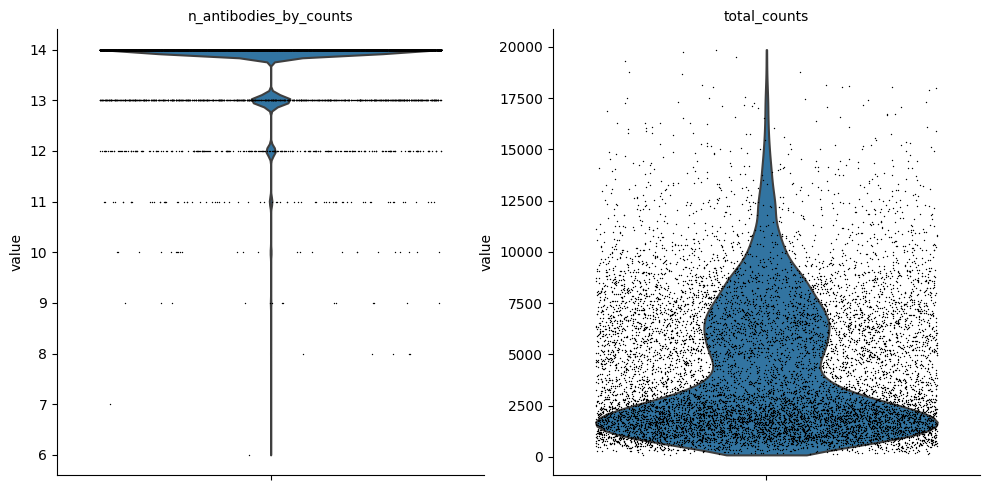

In [43]:
sc.pl.violin(protein_adata, ['n_antibodies_by_counts', 'total_counts'], jitter=0.4, multi_panel=True)

Text(0.5, 1.0, 'Distribution of total counts')

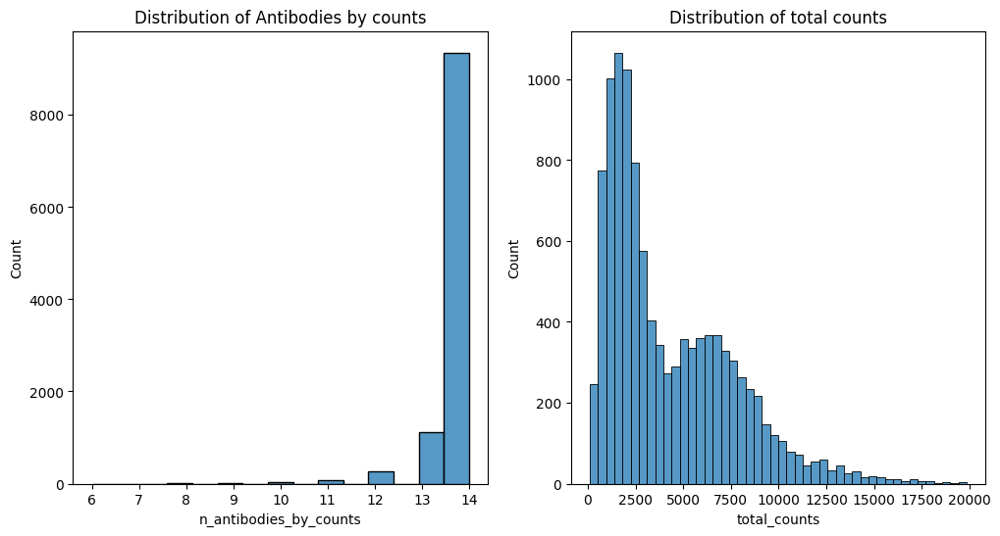

In [44]:
# sns.displot(protein_adata.obs.n_antibodies_by_counts)
# sns.displot(protein_adata.obs.total_counts)

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
sns.histplot(protein_adata.obs.n_antibodies_by_counts)
plt.title('Distribution of Antibodies by counts')
plt.subplot(1,2, 2)
sns.histplot(protein_adata.obs.total_counts)
plt.title("Distribution of total counts")

A major fraction of the cells express all the 14 antibodies with more than 1000 counts.

In [45]:
sc.pp.filter_cells(protein_adata, max_counts=100000)
protein_adata.layers["counts"] = protein_adata.X.copy()

In [46]:
## Normalize Protein data using Centered Log-Ratio normalization
mu.prot.pp.clr(protein_adata, inplace=True )

## Constructing lower dimensional embeddings

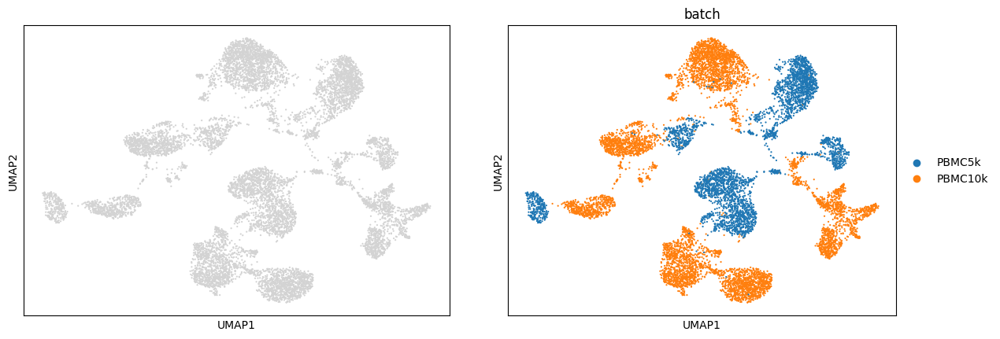

In [47]:
sc.pp.pca(protein_adata, n_comps=13)
sc.pp.neighbors(protein_adata, n_neighbors=30)
protein_adata.obsp["protein_connectivities"] = protein_adata.obsp["connectivities"].copy()
sc.tl.umap(protein_adata)
sc.pl.umap(protein_adata, color=[None, 'batch'], size=10)

Here a clear batch effect is seen.

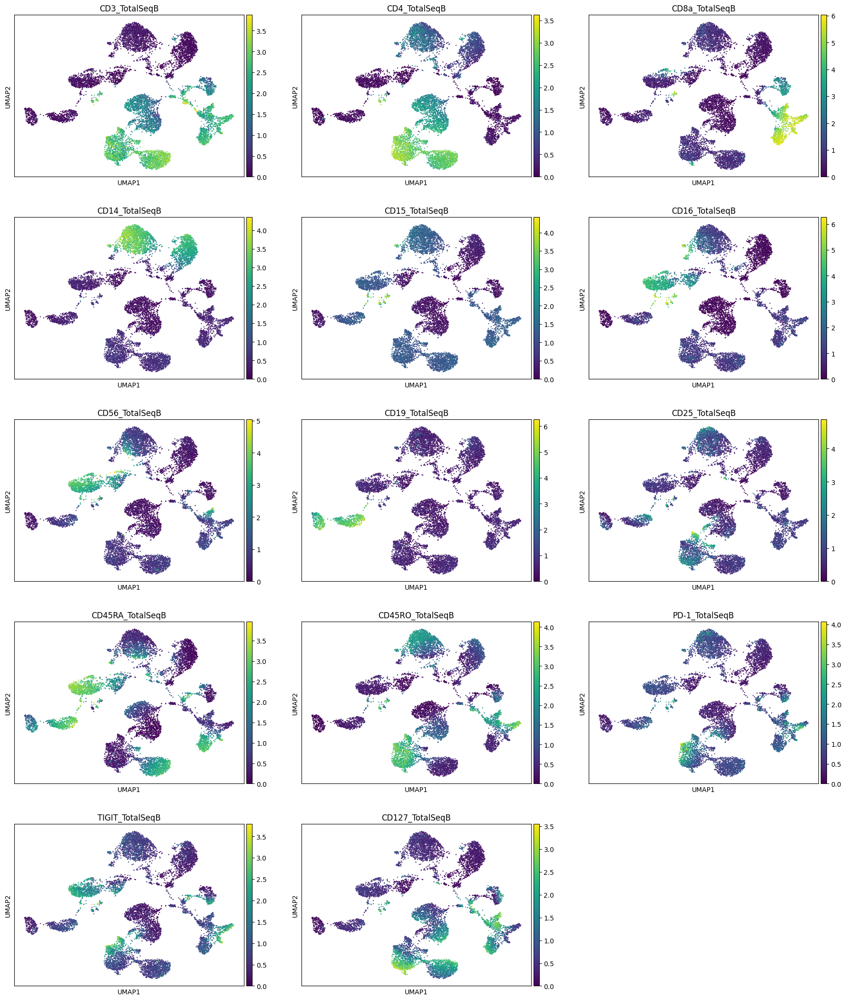

In [48]:
## Visualizing expression of markers
sc.pl.umap(protein_adata, color=protein_adata.var_names.tolist(), ncols = 3)

In [49]:
## Saving Raw data
protein_adata.raw = protein_adata

## Contructing lower dimensional cell type clusters using above embeddings

We will try 3 methods of clustering and try to identify which method works best in describing the protein expression trends visible above

### Leiden Clustering

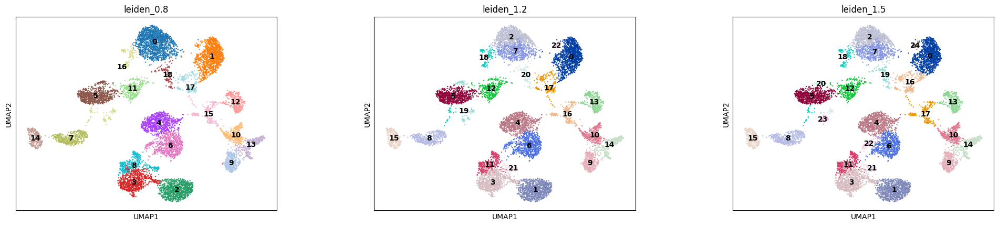

In [50]:
## Visualizing different resolutions of Leiden clustering
sc.tl.leiden(protein_adata, resolution = 0.8, key_added = "leiden_0.8")
sc.tl.leiden(protein_adata, resolution = 1.2, key_added = "leiden_1.2")
sc.tl.leiden(protein_adata, resolution = 1.5, key_added = "leiden_1.5")
sc.pl.umap(protein_adata, color=['leiden_0.8', 'leiden_1.2', 'leiden_1.5'], legend_loc='on data', wspace = 0.25, legend_fontsize=10)

### K-Means Clustering

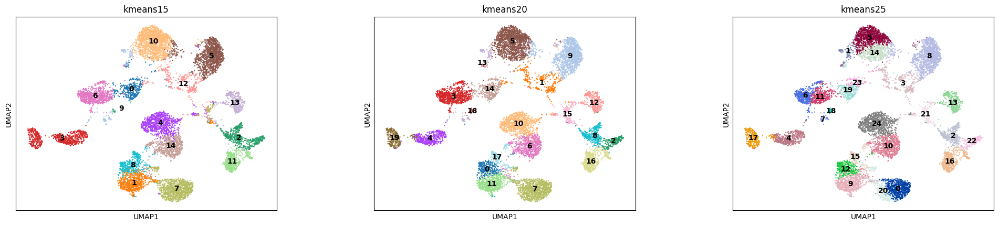

In [51]:
X_pca = protein_adata.obsm['X_pca']
kmeans = KMeans(n_clusters=15, random_state=0).fit(X_pca)
protein_adata.obs['kmeans15'] = kmeans.labels_.astype(str)
kmeans = KMeans(n_clusters=20, random_state=0).fit(X_pca)
protein_adata.obs['kmeans20'] = kmeans.labels_.astype(str)
kmeans = KMeans(n_clusters=25, random_state=0).fit(X_pca)
protein_adata.obs['kmeans25'] = kmeans.labels_.astype(str)
sc.pl.umap(protein_adata, color=['kmeans15', 'kmeans20', 'kmeans25'], legend_loc='on data', wspace=0.25, legend_fontsize=10)

### Hierarchial Clustering

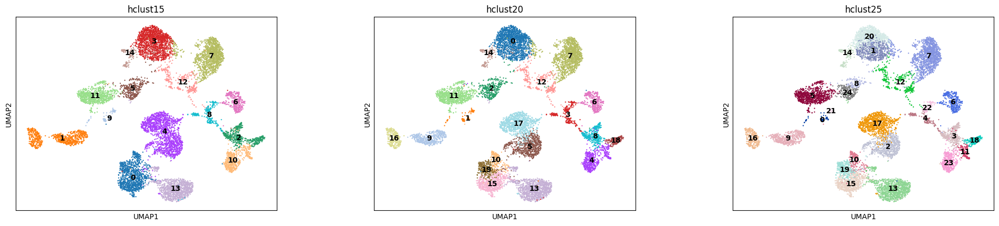

In [52]:
cluster = AgglomerativeClustering(n_clusters=15, affinity='euclidean', linkage='ward')
protein_adata.obs['hclust15'] = cluster.fit_predict(X_pca).astype(str)

cluster = AgglomerativeClustering(n_clusters=20, affinity='euclidean', linkage='ward')
protein_adata.obs['hclust20'] = cluster.fit_predict(X_pca).astype(str)

cluster = AgglomerativeClustering(n_clusters=25, affinity='euclidean', linkage='ward')
protein_adata.obs['hclust25'] = cluster.fit_predict(X_pca).astype(str)

sc.pl.umap(protein_adata, color=['hclust15', 'hclust20', 'hclust25'], legend_loc='on data', wspace = 0.25, legend_fontsize=10)

From the above clustering, we reject all three clusters for Hierarchial clustering as it fails to form a cluster good enough to identify CD14_TotalSeqB. K-Means and Leiden clustering is able to highlight this cluster. For a very narrow distinction between CD3 and CD4 expression, K-means and Leiden show similar clusters, but Leiden displaying slightly better groupings. We choose to go ahead with Leiden with a resolution of 1.2

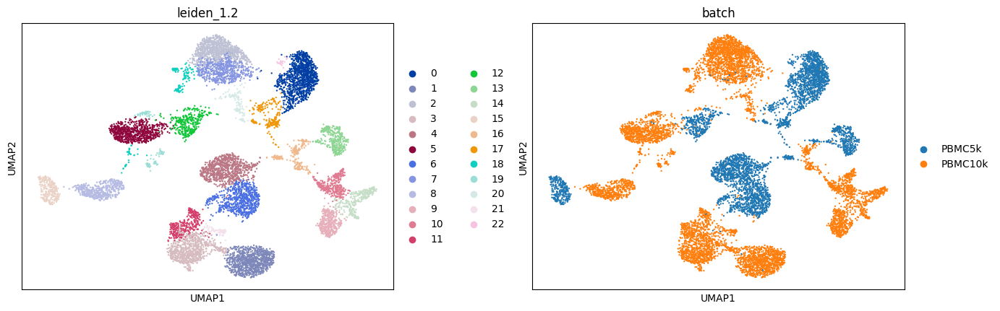

In [53]:
## View Final cluster selected - needs to be accounted for batch/ sample differences
sc.pl.umap(protein_adata, color=['leiden_1.2', 'batch'], wspace = 0.25, legend_fontsize=10)

There is clearly differences due to different batches

## Batch Correction

In [54]:
## Using Harmony tool for batch correction
protein_adata = protein_adata.raw.to_adata()  # Re-loading raw data

ho = hm.run_harmony(protein_adata.X, protein_adata.obs, ['batch'])
pc_std = np.std(ho.Z_corr, axis=1).tolist()
protein_adata.obsm["X_pcahm"] = ho.Z_corr.transpose()

2023-12-27 03:44:01,008 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2023-12-27 03:44:06,977 - harmonypy - INFO - sklearn.KMeans initialization complete.
2023-12-27 03:44:07,156 - harmonypy - INFO - Iteration 1 of 10
2023-12-27 03:44:11,376 - harmonypy - INFO - Iteration 2 of 10
2023-12-27 03:44:15,572 - harmonypy - INFO - Iteration 3 of 10
2023-12-27 03:44:17,373 - harmonypy - INFO - Iteration 4 of 10
2023-12-27 03:44:18,972 - harmonypy - INFO - Converged after 4 iterations


In [55]:
## Redo Clustering
sc.pp.neighbors(protein_adata, n_pcs=13, use_rep="X_pcahm")
sc.tl.umap(protein_adata)
sc.tl.leiden(protein_adata, resolution=1.2, key_added = "leiden_1.2")

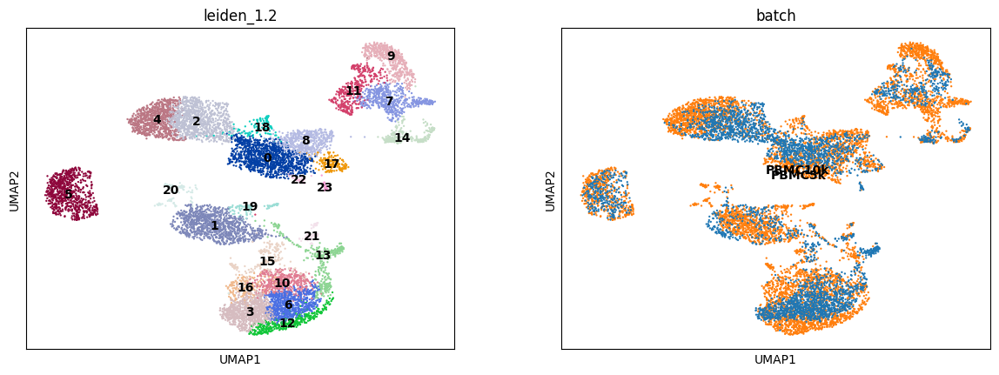

In [56]:
## Visualizing Batch Corrected Clusters
sc.pl.umap(protein_adata, color=["leiden_1.2", "batch"], legend_loc='on data')

Here we can see that the batch/ sample error has been resolved

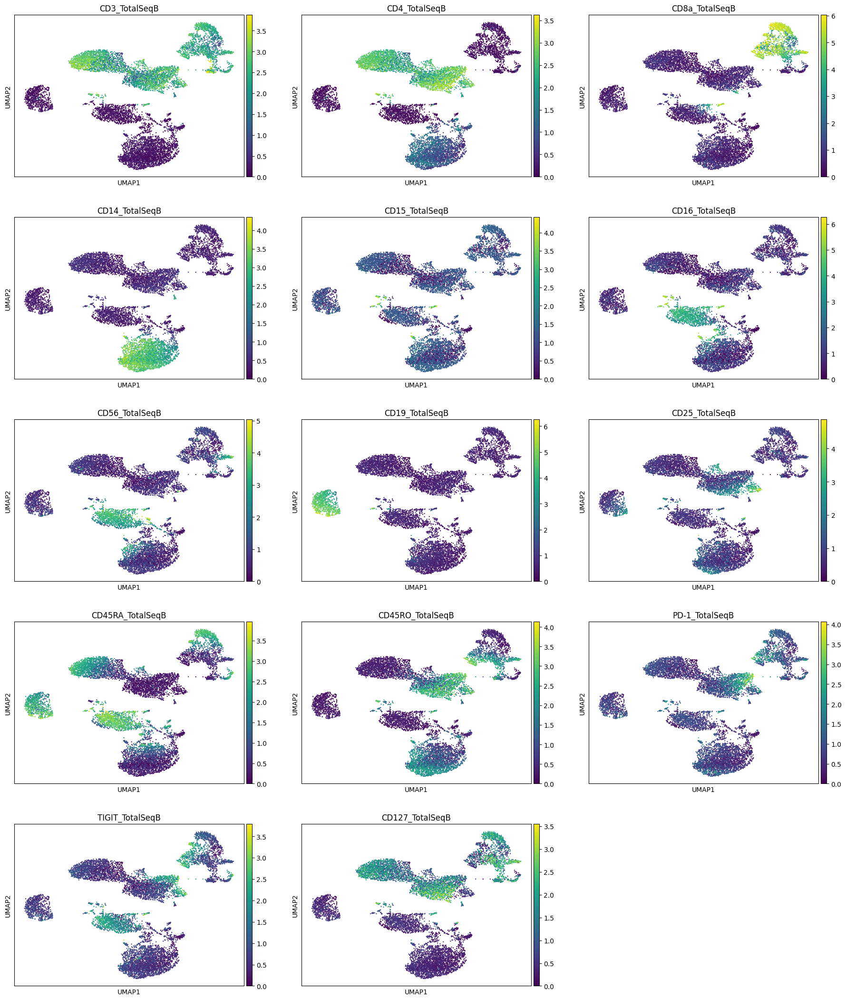

In [57]:
sc.pl.umap(protein_adata, color=protein_adata.var_names.tolist(), ncols = 3)

6,9,11,14 - CD3 - All T cells but only clusters have 0,1,7,9,17,18,22 express both CD3 and CD4. CD4 are markers for T-helper cells and hence the latter set of clusters are more plausibly T-helper cells. Also clusters 0,9,8,14 express CD45RA while 6,11,1,7,17,18,22 express CD45RO which are markers for memory T-cells. Most of these clusters also express CD127 which are markers for memory and effector T-cells. In such case, using transcriptome data as an additional layer of information could help in assigning a specific cell type to each cluster.

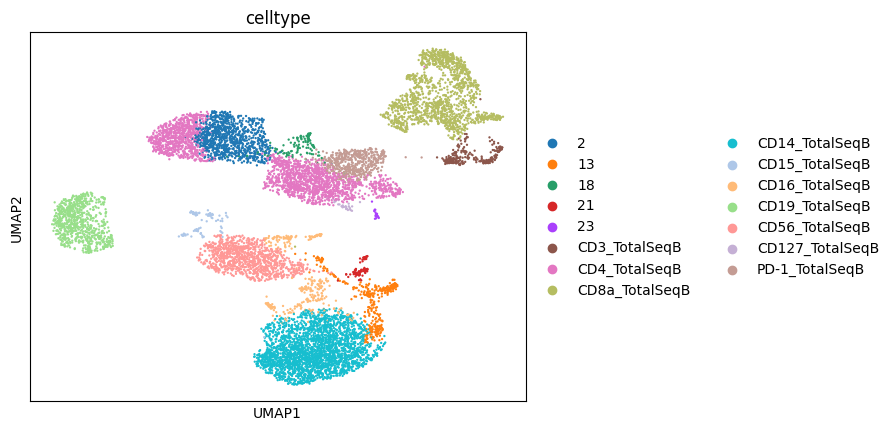

In [58]:
new_cluster_names = {
    "5": "CD19_TotalSeqB", "9": "CD8a_TotalSeqB", "11": "CD8a_TotalSeqB","7": "CD8a_TotalSeqB", "4": "CD3_TotalSeqB", "14": "CD3_TotalSeqB",
    "17": "CD4_TotalSeqB", "0": "CD4_TotalSeqB", "4": "CD4_TotalSeqB",
    "3": "CD14_TotalSeqB", "6": "CD14_TotalSeqB", "10": "CD14_TotalSeqB", "12": "CD14_TotalSeqB", "16": "CD14_TotalSeqB",
    "20": "CD15_TotalSeqB", "22": "CD127_TotalSeqB", "1": "CD56_TotalSeqB",
    "15": "CD16_TotalSeqB", "19": "CD16_TotalSeqB", "8": "PD-1_TotalSeqB",
    }

protein_adata.obs['celltype'] = protein_adata.obs['leiden_1.2'].astype("str").values
protein_adata.obs['celltype'] = protein_adata.obs['leiden_1.2'].map(new_cluster_names).fillna(protein_adata.obs['celltype'])
sc.pl.umap(protein_adata, color="celltype")


## Finding most significantly expressed proteins

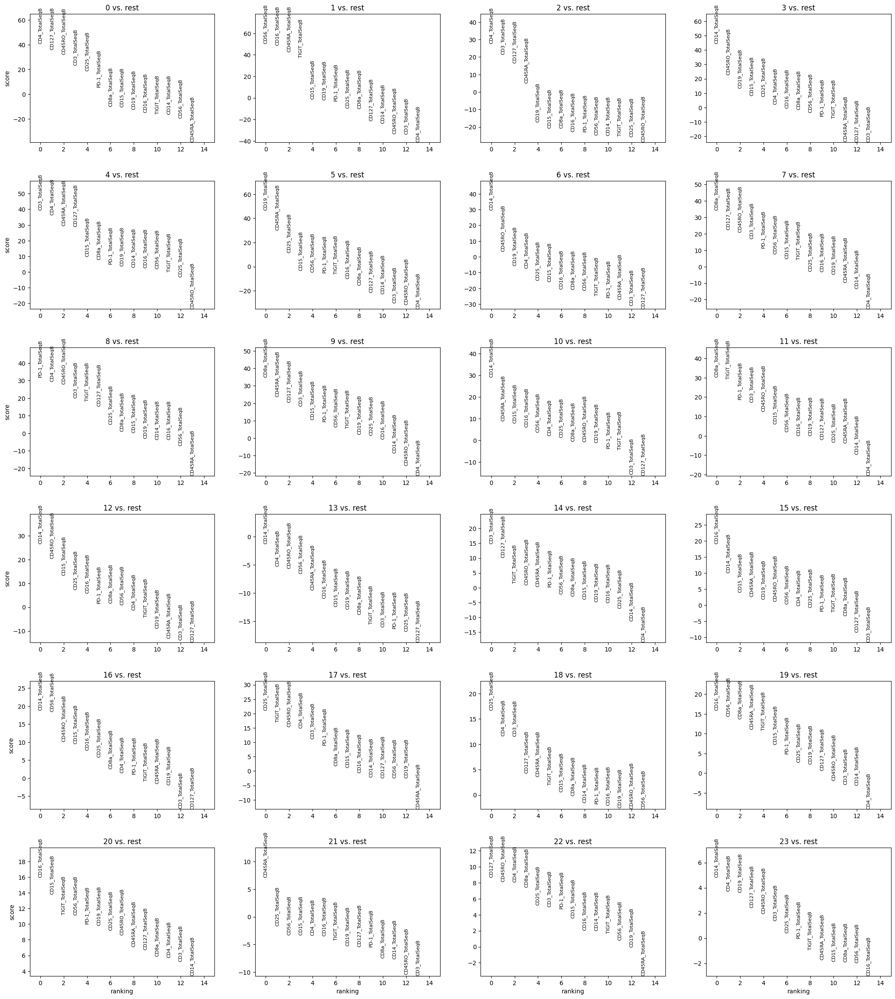

In [59]:
## Finding most significantly expressed proteins
sc.tl.rank_genes_groups(protein_adata, 'leiden_1.2', method='wilcoxon')
sc.pl.rank_genes_groups(protein_adata, n_genes=15, sharey=False)

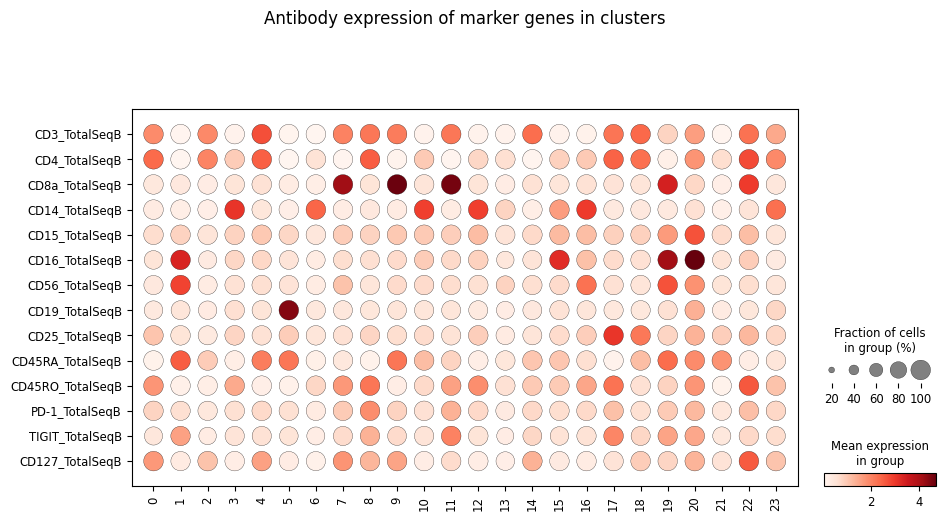

In [60]:
marker_proteins = protein_adata.var.index.tolist()
sc.pl.dotplot(protein_adata, marker_proteins, groupby='leiden_1.2', swap_axes=True, title='Antibody expression of marker genes in clusters')

Based on the surface antibody expressed, the cell-type of each clusters can be identified. For example, clusters 7,9 and 11 are CD8+ T-cells; cluster 5 are B-cells. However, with this information alone it is difficult to assign each cluster to a cell type since a specific immune cell might express many surface proteins that might be expressed in other immune cell types as well.

There are different types of T-cells like effector T-cells, memory T-cells, T-helper cells, cytotoxic T-cells. For example, from the dot plots and the UMAP feature plots, clusters 0,2,4,7,8,9,17,18 express CD3 which is found in all T cells but only clusters 0,2,4,8,17,18,20,22 express both CD3 and CD4. CD4 are markers for T-helper cells and hence the latter set of clusters are more plausibly T-helper cells.

Integrating protein information with transcriptomic data can enhance the power of statistical tests for identifying significant genes, and vice versa. It helps gain a more comprehensive understanding of cellular processes by considering both transcriptional and post-transcriptional regulation.

We can use Protein information to improve transcriptomic analysis in several ways:

- Protein expression data can serve as independent validation for gene expression. If a gene is highly expressed at the transcript level and also shows high protein expression, it adds confidence to the findings.
- Discrepancies between mRNA and protein levels may indicate post-transcriptional regulation. By considering both transcriptomic and proteomic data, we can identify genes that are regulated post-transcription, providing insights into translational control.
- Integration of protein information can also refine the results of differential expression analysis. Genes that are differentially expressed at both the transcript and protein levels are more likely to be biologically significant.

In terms of using transcriptome level data to improve analysis of proteins:
Transcriptomic data can be used to prioritize candidate genes for targeted proteomic analysis. By selecting genes that show interesting patterns at the transcript level, we can focus proteomic efforts on the most relevant candidates.

Specifially in our case, yes, we can use the protein information to improve our test for significant genes. As the RNA and protein data is generated from the same experiments, significantly expressed genes should also lead to significant expression of corresponding proteins. Because protein clusters are smaller (i.e. only 14) we can first analyze which protein antibodies are enriched. As protein antibodies have certain genes associated with them, we can selectively choose these genes are they are bound to be significantly enriched.
For example:
* In protein dotplot, CD16 is highly enriched. CD16 is present on the surface of Natural Killer Cells (NKCs) and macrophages. Now, in the RNA dotplot, NKG7 is enriched in cluster 4 and 11.
* Similarly CD19, which is present on surface of B cells, is highly expressed in cluster 5. If we look at RNA dotplot, we see that MS4A1, which is a marker for B Cells is also highly expresesd.

The vice-versa, i.e. using gene information for improving power of protein significance call also be done using the same principles. Find highly enriched genes and select only the antibodies they are mostly associated with.

A word of caution about Post-translational modifications (PTMs). They may not have a direct correspondence with changes at the mRNA level. Changes in PTMs can occur independently of changes in gene expression. If we perform integrative analyses, we should be cautious about assuming a direct correlation between mRNA levels and protein abundance, especially when PTMs are involved. Incorporating other omics data or pathway analysis might provide a more comprehensive view.